PREDICTING HOUSE PRICES

Vishal Kumar(M24CPS014),Himanshu Pathak(M24CPS004),Anuj Yadav(M24CPS002),		Subham Pandey(P21EE015),Ankush Chaudhary(M24EEI021)


Predicting house prices with linear regression



In [ ]:
import pandas as pd
import numpy as np
from sklearn.metrics import mean_squared_error
from sklearn.preprocessing import StandardScaler, OneHotEncoder
from sklearn.compose import ColumnTransformer
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression

#loading the datasets
training_data = pd.read_csv('train.csv')
testing_data = pd.read_csv('test.csv')
sample_submission = pd.read_csv('sample_submission.csv')

#dropping coloumns having high missing values
coloumns_to_drop = ['Alley', 'PoolQC', 'Fence', 'MiscFeature']
training_data.drop(columns=coloumns_to_drop, inplace=True)
testing_data.drop(columns=coloumns_to_drop, inplace=True)

#fill missing values in the training data
for col_name in training_data.columns:
  if training_data[col_name].dtype == 'object':
    training_data[col_name] = training_data[col_name].fillna(training_data[col_name].mode()[0])
  else:
    training_data[col_name]=training_data[col_name].fillna(training_data[col_name].mean())

#fill missing values in the given testing data
for col_name in testing_data.columns:
  if testing_data[col_name].dtype == 'object':
    testing_data[col_name] = testing_data[col_name].fillna(testing_data[col_name].mode()[0])
  else:
    testing_data[col_name] = testing_data[col_name].fillna(testing_data[col_name].median())

#now separating features and target
X = training_data.drop(columns=['Id', 'SalePrice'])
y = training_data['SalePrice']
test_features = testing_data.drop(columns=['Id'])

#Identify categorical and numerical coloumns
categorical_cols = X.select_dtypes(include=['object']).columns
numerical_cols = X.select_dtypes(exclude=['object']).columns

#preprocess the data
preprocessor = ColumnTransformer(
    transformers=[
        ('num', StandardScaler(), numerical_cols),
        ('cat', OneHotEncoder(handle_unknown='ignore'), categorical_cols)
    ])

X_preprocessed = preprocessor.fit_transform(X)
test_transformed = preprocessor.transform(test_features)

#splitting the data for training and validation
X_train_data, X_val, y_train_data, y_val = train_test_split(X_preprocessed, y, test_size=0.2, random_state=42)

#training the linear regressoin model to get the results accordingly
model = LinearRegression()
model.fit(X_train_data, y_train_data)

#making predictions on the validation set there
y_pred = model.predict(X_val)

#calculating the mean squared error
rmse = mean_squared_error(y_val, y_pred)
print("Validation RMSE:", rmse)

#predict on test set
predictions = model.predict(test_transformed)

#preparing the submission file
submission = pd.DataFrame({'Id': testing_data['Id'], 'SalePrice': predictions})
submission.to_csv('submission.csv', index=False)
print("Submission file created successfully.")

#displaying the entire submission DataFrame
pd.set_option('display.max_rows', None)
print(submission)

#reset display option if you wish to limit future outputs
pd.reset_option('display.max_rows')

Validation RMSE: 886663870.0609674
Submission file created successfully.
        Id      SalePrice
0     1461  117598.384700
1     1462  164294.615339
2     1463  188205.194003
3     1464  198204.973013
4     1465  208662.078912
5     1466  172834.750879
6     1467  184490.419168
7     1468  156840.400143
8     1469  210388.829857
9     1470  114464.264487
10    1471  152351.235457
11    1472   95639.594308
12    1473   95100.345627
13    1474  147538.646804
14    1475  106368.595692
15    1476  372955.098746
16    1477  258068.716477
17    1478  311867.664253
18    1479  307336.739643
19    1480  480932.806755
20    1481  303331.741064
21    1482  200513.309277
22    1483  174406.207093
23    1484  159718.511384
24    1485  174443.092237
25    1486  188414.038603
26    1487  341268.238579
27    1488  226796.080492
28    1489  205581.002281
29    1490  259181.796432
30    1491  195653.225497
31    1492   98827.049458
32    1493  200691.945814
33    1494  337189.226930
34    1495  29082

Decision Tree Implementation

/usr/local/lib/python3.10/dist-packages/numpy/ma/core.py:2820: RuntimeWarning: invalid value encountered in cast
  _data = np.array(data, dtype=dtype, copy=copy,


Validation RMSE: 41170.008217308976


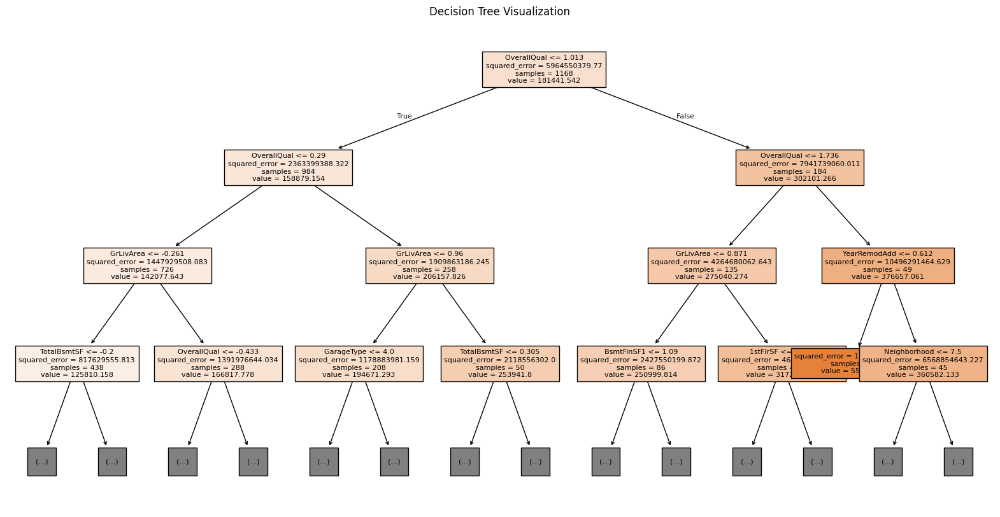

In [ ]:
# Import  libraries
import pandas as pd
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.preprocessing import StandardScaler, LabelEncoder
from sklearn.impute import SimpleImputer
from sklearn.tree import DecisionTreeRegressor, plot_tree
from sklearn.metrics import mean_squared_error
import numpy as np
import matplotlib.pyplot as plt


train_data = pd.read_csv('/content/train.csv')
test_data = pd.read_csv('/content/test.csv')
sample_submission = pd.read_csv('/content/sample_submission.csv')


train_data = train_data.drop(columns=['Id'])
test_data_ids = test_data['Id']
test_data = test_data.drop(columns=['Id'])

# Separate features and target in training data
X = train_data.drop(columns=['SalePrice'])
y = train_data['SalePrice']

# Identify categorical and numerical columns
categorical_cols = X.select_dtypes(include=['object']).columns
numerical_cols = X.select_dtypes(exclude=['object']).columns

# Step 1: Impute missing values
# Numerical columns: Fill missing values with the median
num_imputer = SimpleImputer(strategy='median')
X[numerical_cols] = num_imputer.fit_transform(X[numerical_cols])
test_data[numerical_cols] = num_imputer.transform(test_data[numerical_cols])


cat_imputer = SimpleImputer(strategy='most_frequent')
X[categorical_cols] = cat_imputer.fit_transform(X[categorical_cols])
test_data[categorical_cols] = cat_imputer.transform(test_data[categorical_cols])

# Step 2: Encode categorical variables
label_encoder = LabelEncoder()
for col in categorical_cols:
    X[col] = label_encoder.fit_transform(X[col])
    test_data[col] = label_encoder.transform(test_data[col])

# Step 3: Normalize numerical features
scaler = StandardScaler()
X[numerical_cols] = scaler.fit_transform(X[numerical_cols])
test_data[numerical_cols] = scaler.transform(test_data[numerical_cols])

# Split the data into training and validation sets
X_train, X_valid, y_train, y_valid = train_test_split(X, y, test_size=0.2, random_state=42)

# Implementing Decision Tree Regression with Hyperparameter Tuning
dt_model = DecisionTreeRegressor(random_state=42)


param_grid = {
    'max_depth': [5, 10, 15],
    'min_samples_split': [2, 5, 10],
    'min_samples_leaf': [1, 2, 4]
}

# Perform GridSearchCV to find the best parameters
grid_search = GridSearchCV(estimator=dt_model, param_grid=param_grid, cv=3, scoring='neg_mean_squared_error', n_jobs=-1)
grid_search.fit(X_train, y_train)

best_dt_model = grid_search.best_estimator_

# Predicting on validation set
y_valid_pred = best_dt_model.predict(X_valid)

# Evaluating the Decision Tree model
rmse = np.sqrt(mean_squared_error(y_valid, y_valid_pred))
print("Validation RMSE:", rmse)

# Visualize the Decision Tree
plt.figure(figsize=(20,10))
plot_tree(best_dt_model, filled=True, feature_names=X.columns, max_depth=3, fontsize=8)
plt.title("Decision Tree Visualization")
plt.show()


K Means Implementation

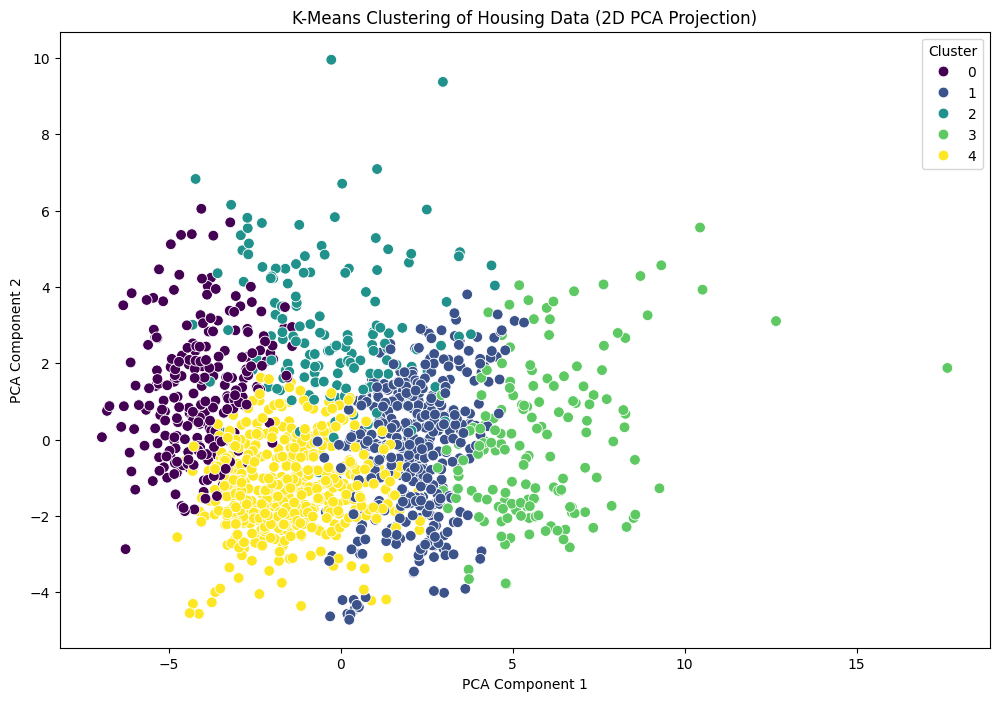

In [ ]:
# Import necessary libraries
import pandas as pd
from sklearn.preprocessing import StandardScaler, LabelEncoder
from sklearn.impute import SimpleImputer
from sklearn.cluster import KMeans
from sklearn.decomposition import PCA
import matplotlib.pyplot as plt
import seaborn as sns

# Loading the dataset with correct paths
train_data = pd.read_csv('/content/train.csv')

# Drop the 'Id' column from train data
train_data = train_data.drop(columns=['Id'])

# Separate features and target in training data
X = train_data.drop(columns=['SalePrice'])

# Identify categorical and numerical columns
categorical_cols = X.select_dtypes(include=['object']).columns
numerical_cols = X.select_dtypes(exclude=['object']).columns

# Step 1: Impute missing values
# Numerical columns: Fill missing values with the median
num_imputer = SimpleImputer(strategy='median')
X[numerical_cols] = num_imputer.fit_transform(X[numerical_cols])


cat_imputer = SimpleImputer(strategy='most_frequent')
X[categorical_cols] = cat_imputer.fit_transform(X[categorical_cols])

# Step 2: Encode categorical variables
label_encoder = LabelEncoder()
for col in categorical_cols:
    X[col] = label_encoder.fit_transform(X[col])

# Step 3: Normalize features
scaler = StandardScaler()
X = scaler.fit_transform(X)

# Step 4: Apply K-Means Clustering
kmeans = KMeans(n_clusters=5, random_state=42)  # Choose an appropriate number of clusters
X_clusters = kmeans.fit_predict(X)

# Adding the cluster labels to the original data for visualization
train_data['Cluster'] = X_clusters

# Step 5: Dimensionality Reduction for Visualization (PCA)
pca = PCA(n_components=2)
X_pca = pca.fit_transform(X)

# Plotting the clusters
plt.figure(figsize=(12, 8))
sns.scatterplot(x=X_pca[:, 0], y=X_pca[:, 1], hue=train_data['Cluster'], palette='viridis', s=60)
plt.title("K-Means Clustering of Housing Data (2D PCA Projection)")
plt.xlabel("PCA Component 1")
plt.ylabel("PCA Component 2")
plt.legend(title="Cluster")
plt.show()


Bayesian Learning Implementation

Mean Squared Error (MSE): 936220161.1855837
Mean Absolute Error (MAE): 19053.847258976413


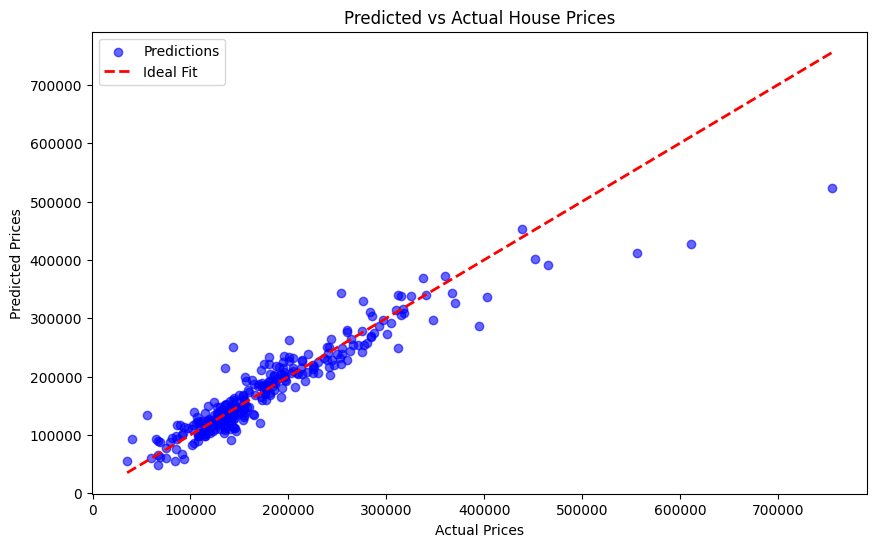

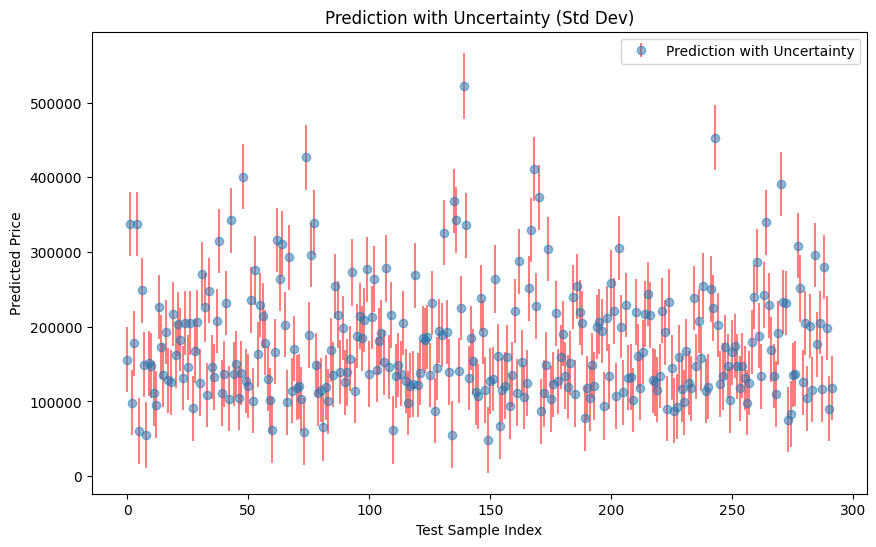

Predictions saved to house_price_predictions.csv


In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from sklearn.linear_model import BayesianRidge
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler, OneHotEncoder
from sklearn.compose import ColumnTransformer
from sklearn.pipeline import Pipeline
from sklearn.impute import SimpleImputer
from sklearn.metrics import mean_squared_error, mean_absolute_error

# Load the training dataset
training_data = pd.read_csv("train.csv")  # Update path as needed
target = 'SalePrice'

# Separate target and features
X = training_data.drop(columns=[target])
y = training_data[target]

# Split numerical and categorical features
num_features = X.select_dtypes(include=['int64', 'float64']).columns
category_features = X.select_dtypes(include=['object']).columns

# Preprocessing pipeline
numerical_transformer = Pipeline(steps=[
    ('imputer', SimpleImputer(strategy='median')),
    ('scaler', StandardScaler())
])

categorical_transformer = Pipeline(steps=[
    ('imputer', SimpleImputer(strategy='most_frequent')),
    ('onehot', OneHotEncoder(handle_unknown='ignore', sparse_output=False))  # Ensure dense output
])

preprocessor = ColumnTransformer(
    transformers=[
        ('num', numerical_transformer, num_features),
        ('cat', categorical_transformer, category_features)
    ])

# Combine preprocessing with Bayesian Ridge Regression in a single pipeline
model = Pipeline(steps=[('preprocessor', preprocessor),
                        ('bayesianridge', BayesianRidge())])

# Split the data into train and test
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Train the model
model.fit(X_train, y_train)

# Predict with uncertainty estimates on the test split
y_pred, y_std = model.predict(X_test, return_std=True)

# Calculate performance metrics
mse = mean_squared_error(y_test, y_pred)
mae = mean_absolute_error(y_test, y_pred)

print(f"Mean Squared Error (MSE): {mse}")
print(f"Mean Absolute Error (MAE): {mae}")

# Plotting Predicted vs Actual Prices
plt.figure(figsize=(10, 6))
plt.scatter(y_test, y_pred, alpha=0.6, color='b', label='Predictions')
plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'r--', lw=2, label='Ideal Fit')
plt.xlabel("Actual Prices")
plt.ylabel("Predicted Prices")
plt.title("Predicted vs Actual House Prices")
plt.legend()
plt.show()

# Plotting Prediction Uncertainty
plt.figure(figsize=(10, 6))
plt.errorbar(range(len(y_test)), y_pred, yerr=y_std, fmt='o', ecolor='red', alpha=0.5, label='Prediction with Uncertainty')
plt.xlabel("Test Sample Index")
plt.ylabel("Predicted Price")
plt.title("Prediction with Uncertainty (Std Dev)")
plt.legend()
plt.show()

# Load the separate test dataset for final predictions
test_data = pd.read_csv("test.csv")  # Update path as needed

# Apply the same preprocessing and predict on test.csv
X_test_kaggle = test_data
y_test_kaggle_pred, y_test_kaggle_std = model.predict(X_test_kaggle, return_std=True)

# Save the results for submission
output = pd.DataFrame({
    'Id': test_data['Id'],
    'Predicted Price': y_test_kaggle_pred,
    'Uncertainty (Std)': y_test_kaggle_std
})
output.to_csv('house_price_predictions.csv', index=False)
print("Predictions saved to house_price_predictions.csv")

Implementation by SVM






Mean Squared Error: 0.01796226900760919
R-squared will be : 0.8901501687233895
Test Predictions: [11.78421878 11.76019891 12.16418019 ... 12.13102546 11.92395214
 12.36435399]


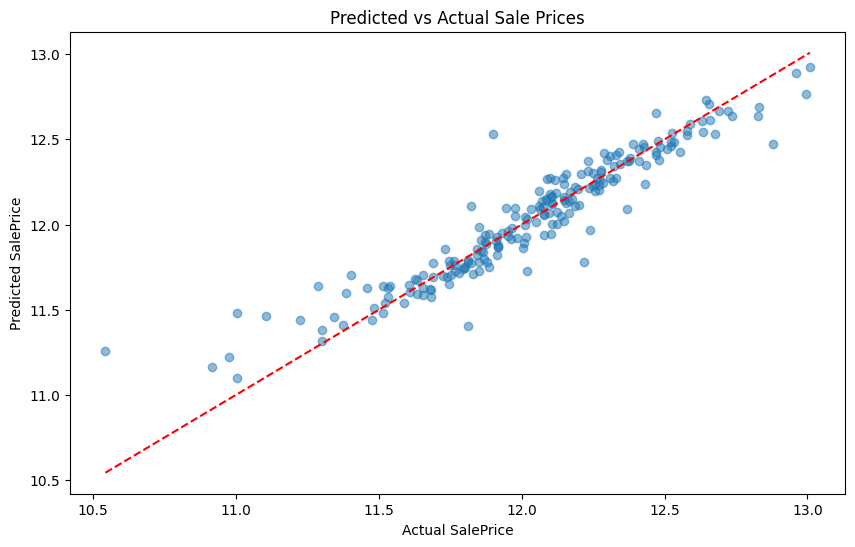

In [ ]:
# Step 1: Import necessary libraries
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import RobustScaler
from sklearn.svm import SVR
from sklearn.metrics import mean_squared_error, r2_score
from scipy import stats
import matplotlib.pyplot as plt

# Step 2: Load the training dataset
train_file_path = '/content/train.csv'
housing_data = pd.read_csv(train_file_path)

# Step 3: Data Preprocessing - Drop irrelevant columns and handle missing values
# Dropping the 'Id' column if present
housing_data = housing_data.drop(columns=['Id'], errors='ignore')

# Fill missing values
for column in housing_data.columns:
    if housing_data[column].dtype == 'object':  # Categorical
        housing_data[column] = housing_data[column].fillna(housing_data[column].mode()[0])  # Replace with most frequent
    else:  # Numerical
        housing_data[column] = housing_data[column].fillna(housing_data[column].mean())  # Replace with mean

# Step 4: Separate features (X) and target variable (y)
X = housing_data.drop('SalePrice', axis=1)
y = housing_data['SalePrice']

# Step 5: Apply log transformation to the target variable
y = np.log1p(y)

# Step 6: Remove outliers based on Z-score
numeric_X = X.select_dtypes(include=[np.number])  # Select only numeric columns for Z-score calculation
z_scores = np.abs(stats.zscore(numeric_X))  # Calculate Z-scores only for numeric columns
X = X[(z_scores < 3).all(axis=1)]  # Remove rows where Z-score is greater than 3
y = y[(z_scores < 3).all(axis=1)]  # Remove corresponding rows in the target variable

# Step 7: Convert categorical columns to numerical using one-hot encoding
X = pd.get_dummies(X, drop_first=True)

# Step 8: Split the data into training and testing sets
features_train, features_test, labels_train, labels_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Step 9: Standardize the features (important for SVM performance)
scaler = RobustScaler()
features_train = scaler.fit_transform(features_train)
features_test = scaler.transform(features_test)

# Step 10: Define and train the Support Vector Regressor model
svm_model = SVR(kernel='rbf', C=100, gamma='scale', epsilon=0.1)
svm_model.fit(features_train, labels_train)

# Step 11: Make predictions on the test set
predictions = svm_model.predict(features_test)

# Step 12: Evaluate the model using Mean Squared Error and R-squared
mse = mean_squared_error(labels_test, predictions)
r2 = r2_score(labels_test, predictions)

print(f'Mean Squared Error: {mse}')
print(f'R-squared will be : {r2}')

# Step 13: Load and preprocess the test dataset
test_file_path = '/content/test.csv'
test_data = pd.read_csv(test_file_path)

# Drop irrelevant columns (e.g., 'Id') if present
test_data = test_data.drop(columns=['Id'], errors='ignore')

# Fill missing values in the test data
for column in test_data.columns:
    if test_data[column].dtype == 'object':  # Categorical
        test_data[column] = test_data[column].fillna(test_data[column].mode()[0])
    else:  # Numerical
        test_data[column] = test_data[column].fillna(test_data[column].mean())

# Apply one-hot encoding (make sure it matches the training data)
test_data = pd.get_dummies(test_data, drop_first=True)
test_data = test_data.reindex(columns=X.columns, fill_value=0)  # Align columns to match the training set

# Step 14: Standardize the test data using the scaler fitted on the training data
test_data = scaler.transform(test_data)

# Step 15: Predict on the actual test data (from test.csv)
test_predictions = svm_model.predict(test_data)
print("Test Predictions:", test_predictions)


# Plot predicted vs. actual values for the test set
plt.figure(figsize=(10, 6))
plt.scatter(labels_test, predictions, alpha=0.5)
plt.xlabel("Actual SalePrice")
plt.ylabel("Predicted SalePrice")
plt.title("Predicted vs Actual Sale Prices")
plt.plot([min(labels_test), max(labels_test)], [min(labels_test), max(labels_test)], color="red", linestyle="--")
plt.show()



Implementation through KNN

KNN Mean Squared Error: 0.04573465948162481
KNN R-squared: 0.7203056793425446


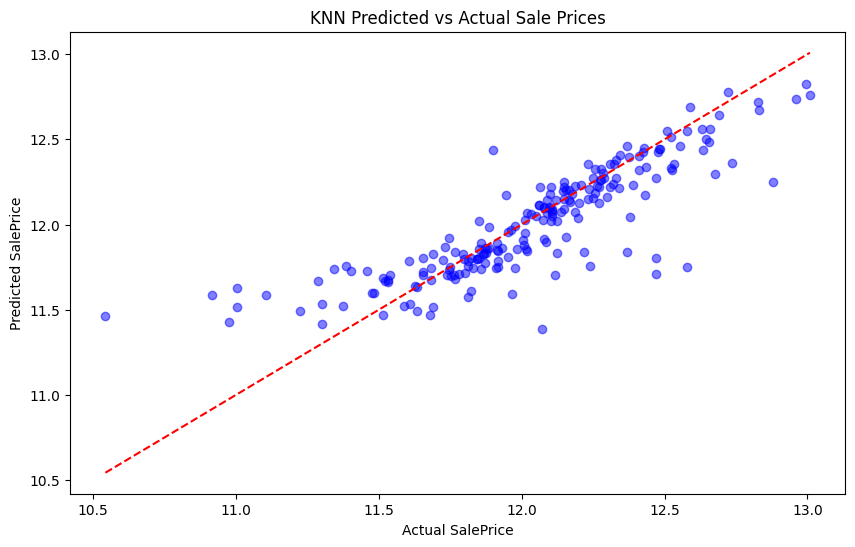

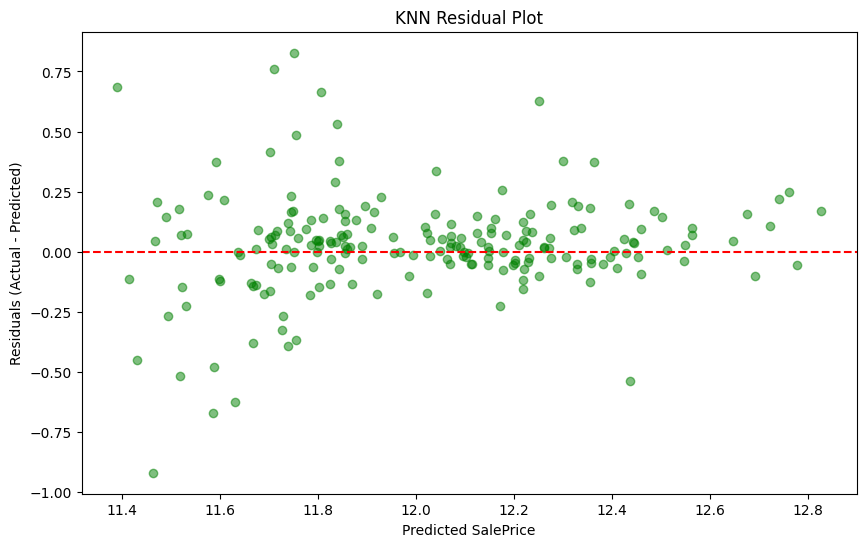

KNN Test Predictions: [12.01164779 11.7984523  12.18864404 ... 12.11821343 11.84997295
 12.16724634]


In [ ]:
# Import the necessary library for KNN
from sklearn.neighbors import KNeighborsRegressor
from sklearn.metrics import mean_squared_error, r2_score
import matplotlib.pyplot as plt

# Step 1: Define the KNN model
# Choosing k (n_neighbors) as 5 initially; you can tune this for better performance
knn_model = KNeighborsRegressor(n_neighbors=5)

# Step 2: Train the KNN model
knn_model.fit(features_train, labels_train)

# Step 3: Predict on the test set
knn_predictions = knn_model.predict(features_test)

# Step 4: Evaluate the model with Mean Squared Error and R-squared
knn_mse = mean_squared_error(labels_test, knn_predictions)
knn_r2 = r2_score(labels_test, knn_predictions)

print(f"KNN Mean Squared Error: {knn_mse}")
print(f"KNN R-squared: {knn_r2}")

# Step 5: Visualize Predicted vs Actual Values
plt.figure(figsize=(10, 6))
plt.scatter(labels_test, knn_predictions, alpha=0.5, color="blue")
plt.xlabel("Actual SalePrice")
plt.ylabel("Predicted SalePrice")
plt.title("KNN Predicted vs Actual Sale Prices")
plt.plot([min(labels_test), max(labels_test)], [min(labels_test), max(labels_test)], color="red", linestyle="--")
plt.show()

# Step 6: Visualize Residuals (Error Plot)
knn_residuals = labels_test - knn_predictions

plt.figure(figsize=(10, 6))
plt.scatter(knn_predictions, knn_residuals, alpha=0.5, color="green")
plt.axhline(y=0, color="red", linestyle="--")
plt.xlabel("Predicted SalePrice")
plt.ylabel("Residuals (Actual - Predicted)")
plt.title("KNN Residual Plot")
plt.show()

# Step 7: Predict on the actual test dataset (from test.csv)
# Preprocess the test dataset similarly as above
test_data = pd.read_csv(test_file_path)
test_data = test_data.drop(columns=['Id'], errors='ignore')

for column in test_data.columns:
    if test_data[column].dtype == 'object':
        test_data[column] = test_data[column].fillna(test_data[column].mode()[0])
    else:
        test_data[column] = test_data[column].fillna(test_data[column].mean())

# Apply one-hot encoding to match the training data
test_data = pd.get_dummies(test_data, drop_first=True)
test_data = test_data.reindex(columns=X.columns, fill_value=0)  # Align columns with training data

# Standardize the test data using the scaler fitted on the training data
test_data = scaler.transform(test_data)

# Predict on the actual test data
knn_test_predictions = knn_model.predict(test_data)
print("KNN Test Predictions:", knn_test_predictions)


Implementation by Neural Networks

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1460 entries, 0 to 1459
Data columns (total 81 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   Id             1460 non-null   int64  
 1   MSSubClass     1460 non-null   int64  
 2   MSZoning       1460 non-null   object 
 3   LotFrontage    1201 non-null   float64
 4   LotArea        1460 non-null   int64  
 5   Street         1460 non-null   object 
 6   Alley          91 non-null     object 
 7   LotShape       1460 non-null   object 
 8   LandContour    1460 non-null   object 
 9   Utilities      1460 non-null   object 
 10  LotConfig      1460 non-null   object 
 11  LandSlope      1460 non-null   object 
 12  Neighborhood   1460 non-null   object 
 13  Condition1     1460 non-null   object 
 14  Condition2     1460 non-null   object 
 15  BldgType       1460 non-null   object 
 16  HouseStyle     1460 non-null   object 
 17  OverallQual    1460 non-null   int64  
 18  OverallC

/usr/local/lib/python3.10/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


30/30 ━━━━━━━━━━━━━━━━━━━━ 3s 19ms/step - loss: 38996127744.0000 - val_loss: 37840957440.0000
Epoch 2/100
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 40569511936.0000 - val_loss: 37837533184.0000
Epoch 3/100
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 39953338368.0000 - val_loss: 37827903488.0000
Epoch 4/100
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 39604932608.0000 - val_loss: 37804744704.0000
Epoch 5/100
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 39025856512.0000 - val_loss: 37757726720.0000
Epoch 6/100
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 40372088832.0000 - val_loss: 37676445696.0000
Epoch 7/100
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 39171493888.0000 - val_loss: 37556670464.0000
Epoch 8/100
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 38280409088.0000 - val_loss: 37379817472.0000
Epoch 9/100
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 40891822080.0000 - val_loss: 37134716928.0000
Epoch 10/100
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 394354

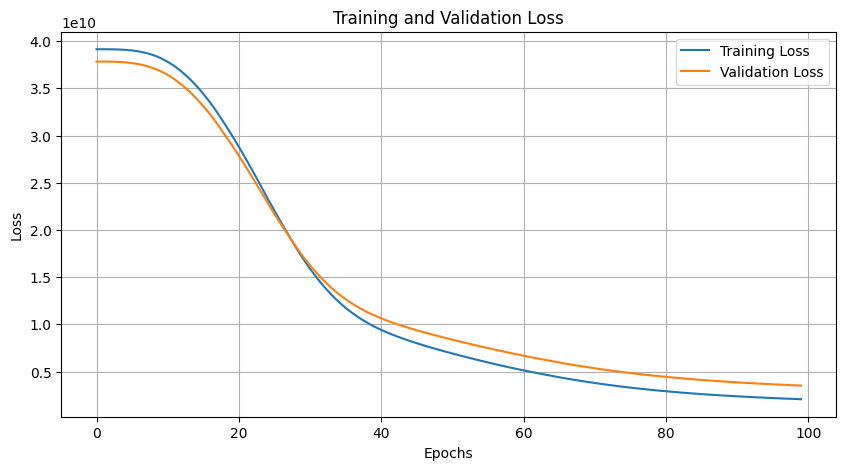

10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 2651257600.0000 
Test Loss: 2642969344.0
10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step 
46/46 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
Test Predictions: [[ 98125.11 ]
 [100662.73 ]
 [175114.83 ]
 ...
 [125735.305]
 [ 47554.25 ]
 [203698.12 ]]


/usr/local/lib/python3.10/dist-packages/visualkeras/layered.py:86: UserWarning: The legend_text_spacing_offset parameter is deprecated and will be removed in a future release.
  warnings.warn("The legend_text_spacing_offset parameter is deprecated and will be removed in a future release.")


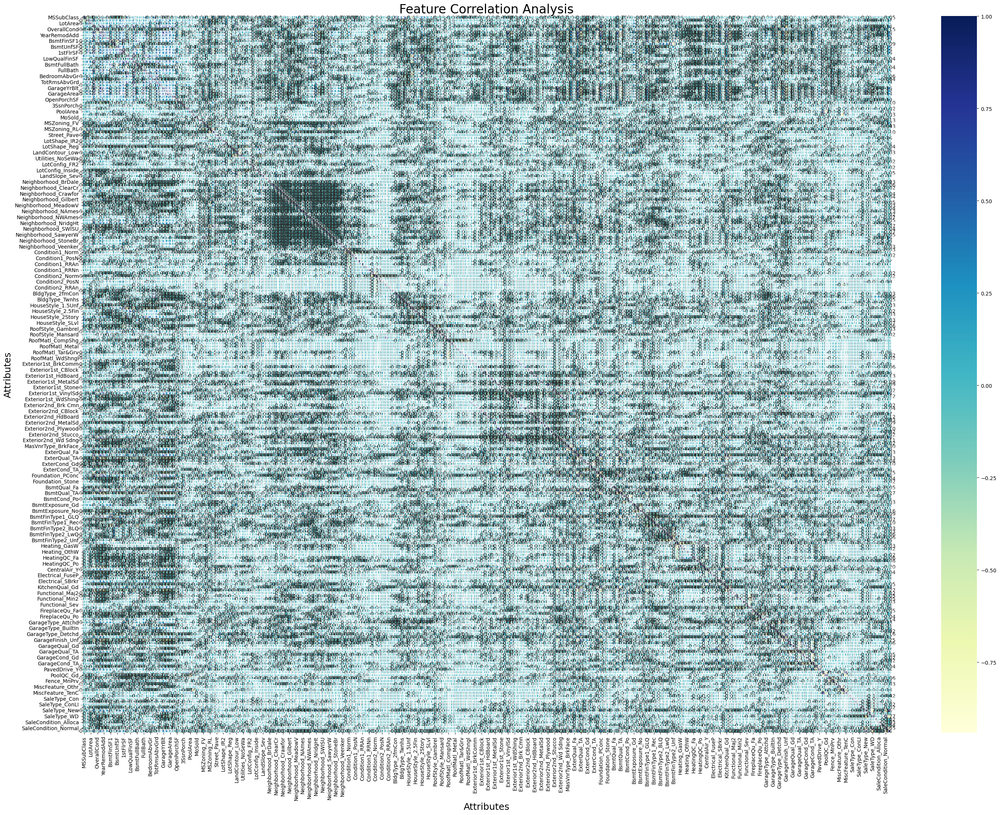

In [14]:
# Install necessary packages (if running in a new environment)
!pip install visualkeras ann_visualizer

# Import required libraries
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense
from tensorflow.keras.optimizers import Adam
import visualkeras
from ann_visualizer.visualize import ann_viz

# Load the training dataset
train_file_path = '/content/train.csv'
housing_data = pd.read_csv(train_file_path)

# Print some info about the dataset to check for issues
print(housing_data.info()) # Check data types and non-null counts
print(housing_data.describe()) # Get summary statistics

# Data Preprocessing for Training Data
# Dropping irrelevant columns (e.g., 'Id') and handling missing values
housing_data = housing_data.drop(columns=['Id'], errors='ignore')

# Fill missing values
for column in housing_data.columns:
    if housing_data[column].dtype == 'object':  # Categorical
        housing_data[column] = housing_data[column].fillna(housing_data[column].mode()[0]) # Replace with most frequent
    else:  # Numerical
        housing_data[column] = housing_data[column].fillna(housing_data[column].mean()) # Replace with mean

# Separate features and target variable ('SalePrice')
X = housing_data.drop('SalePrice', axis=1)
y = housing_data['SalePrice']

# Convert categorical columns to numerical with one-hot encoding
X = pd.get_dummies(X, drop_first=True)

# Split the data into training and testing sets
features_train, features_test, labels_train, labels_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Standardize the features
scaler = StandardScaler()
features_train = scaler.fit_transform(features_train)
features_test = scaler.transform(features_test)

# Neural Network Model
pricing_model = Sequential()
pricing_model.add(Dense(64, input_dim=features_train.shape[1], activation='relu'))
pricing_model.add(Dense(32, activation='relu'))
pricing_model.add(Dense(1))  # Output layer for price prediction

# Compile the model
pricing_model.compile(optimizer=Adam(learning_rate=0.001), loss='mean_squared_error')

# Train the model
num_epochs = 100
history = pricing_model.fit(features_train, labels_train, validation_split=0.2, epochs=num_epochs, batch_size=32)

# Plot Training and Validation Loss
plt.figure(figsize=(10, 5))
plt.plot(history.history['loss'], label='Training Loss')
plt.plot(history.history['val_loss'], label='Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.title('Training and Validation Loss')
plt.legend(loc='upper right')
plt.grid()
plt.show()

# Evaluate the model on test data
test_loss = pricing_model.evaluate(features_test, labels_test)
print(f'Test Loss: {test_loss}')

# Predictions on the test set
predictions = pricing_model.predict(features_test)

# Load and Preprocess the Test Dataset (test.csv)
test_file_path = '/content/test.csv'
test_data = pd.read_csv(test_file_path)

# Drop irrelevant columns (e.g., 'Id') if present
test_data = test_data.drop(columns=['Id'], errors='ignore')

# Fill missing values in test data
for column in test_data.columns:
    if test_data[column].dtype == 'object':  # Categorical
        test_data[column] = test_data[column].fillna(test_data[column].mode()[0])
    else:  # Numerical
        test_data[column] = test_data[column].fillna(test_data[column].mean())

# Apply one-hot encoding (ensure it matches training data)
test_data = pd.get_dummies(test_data, drop_first=True)
test_data = test_data.reindex(columns=X.columns, fill_value=0)  # Align columns

# Standardize test data using the scaler fitted on training data
test_data = scaler.transform(test_data)

# Predict on the actual test data (test.csv)
test_predictions = pricing_model.predict(test_data)
print("Test Predictions:", test_predictions)

# Optional: Visualize the Neural Network model
visualkeras.layered_view(pricing_model, legend=True)  # Using visualkeras for layer view

# Correlation Heatmap for Feature Analysis
corr_matrix = X.corr()  # Use X, which has one-hot encoded numerical data
plt.figure(figsize=(35, 25))
sns.heatmap(corr_matrix, annot=True, cmap='YlGnBu', fmt=".2f", linewidths=0.5, linecolor='grey')
plt.title('Feature Correlation Analysis', fontsize=24)
plt.xlabel('Attributes', fontsize=18)
plt.ylabel('Attributes', fontsize=18)
plt.show()
